In [1]:
!pip install openmm[cuda12]
!pip install git+https://github.com/KULL-Centre/CALVADOS.git@colab_compatible

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 39.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.4/14.4 MB 83.9 MB/s eta 0:00:00
  Cloning https://github.com/KULL-Centre/CALVADOS.git (to revision colab_compatible) to /tmp/pip-req-build-bcsqb56h
  Running command git clone --filter=blob:none --quiet https://github.com/KULL-Centre/CALVADOS.git /tmp/pip-req-build-bcsqb56h
  Running command git checkout -b colab_compatible --track origin/colab_compatible
  Switched to a new branch 'colab_compatible'
  Branch 'colab_compatible' set up to track remote branch 'colab_compatible' from 'origin'.
  Resolved https://github.com/KULL-Centre/CALVADOS.git to commit 78387b36922fb4d32c1ff59b9143ab31a0829d11
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 69.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 93.6 MB/s eta 0:00

In [17]:
!pip install nglview

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.2/26.2 MB 73.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 121.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 80.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.8/59.8 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 66.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 52.2 MB/s eta 0:00:00
  Created wheel for nglview: filename=nglview-4.0.1-py3-none-any.whl size=10672421 sha256=4ae8af75825ede23457f7f1e15fb551c0c6d1a9bc870616ec6d347dffd87b822
  Stored in directory: /root/.cache/

# Import and functions

In [4]:
import os
import calvados as cal
from calvados.cfg import Config, Job, Components, load_ebi
from calvados import sim
import subprocess
import numpy as np
import numba as nb
import math
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import MDAnalysis as mda

import json
import requests
from pathlib import Path

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

plt.rcParams['font.size'] = 6
plt.rcParams['ytick.major.size'] = 2
plt.rcParams['ytick.minor.size'] = 1
plt.rcParams['xtick.major.size'] = 2
plt.rcParams['xtick.minor.size'] = 1
plt.rcParams['xtick.labelsize'] = 6
plt.rcParams['ytick.labelsize'] = 6
plt.rcParams['axes.linewidth'] = 0.5
plt.rcParams['axes.labelpad'] = 2
plt.rcParams['savefig.pad_inches'] = 0.1
plt.rcParams['figure.dpi'] = 300
plt.rcParams['lines.markersize'] = 3
plt.rcParams['lines.markeredgewidth'] = 0.5
plt.rcParams['lines.linewidth'] = 1.
# plt.rcParams['font.serif'] = 'Times New Roman'
# plt.rcParams['font.sans-serif'] = 'Arial'
# plt.rcParams['font.monospace'] = 'Courier New'
plt.rcParams['figure.max_open_warning'] = 30

col1x = 3.425 # column
col2x = 7. # 2x column

github_folder = 'https://raw.githubusercontent.com/KULL-Centre/CALVADOS/colab_compatible'

cwd = os.getcwd()
os.makedirs(f'{cwd}/input',exist_ok=True)
os.system(f'wget -O input/residues.csv {github_folder}/examples/single_AF_CALVADOS/input/residues.csv')


def load_pae(name, pdb_folder):
    input_pae = f'{pdb_folder}/{name}.json'
    pae = cal.build.load_pae(input_pae,symmetrize=True,colabfold=0) / 10. # nm
    return pae

def calc_rgs(name, path, start=10,stop=None,step=1):
    u = mda.Universe(f'{path}/top.pdb',f'{path}/{name}.dcd')
    ag = u.atoms
    rg = cal.analysis.calc_rg(u, ag, start=start, stop=stop, step=step)
    return rg

def calc_ees(name, path, start=10,stop=None,step=1):
    u = mda.Universe(f'{path}/top.pdb',f'{path}/{name}.dcd')
    ag = u.atoms
    ees, _, _ = cal.analysis.calc_ete(u,ag,start=start,stop=stop,step=step)
    return ees

def calc_timesteps(name, path, start=10, stop=None, step=1):
    u = mda.Universe(f'{path}/top.pdb',f'{path}/{name}.dcd')
    dt = u.trajectory[0].dt * step
    xs = np.arange(len(u.trajectory[start:stop:step])) * dt / 1000.
    return xs

def calc_dmap_std_manual(name, path, start=10,stop=None,step=1):
    u = mda.Universe(f'{path}/top.pdb',f'{path}/{name}.dcd')
    ag = u.atoms

    box = u.dimensions[:3] / 10.
    coordinates = u.trajectory.timeseries(ag) / 10.

    nres = len(ag)

    dmap_std_manual = calc_dmap_std_numba(coordinates,box,nres,start=start,stop=stop,step=step)
    return dmap_std_manual

@staticmethod
@nb.jit(nopython=True)
def calc_dmap_std_numba(coordinates,box,nres,start=10,stop=None,step=1):
    dmaps_std_manual = np.zeros((nres,nres))

    for idx in range(nres):
        for jdx in range(idx,nres):
            x0 = coordinates[idx,start:stop:step]
            x1 = coordinates[jdx,start:stop:step]
            dvec = x1-x0
            dvec_pbc = np.where(dvec<=box/2, dvec, box-dvec)
            d = np.zeros((len(x0)))
            for kdx, dv_pbc in enumerate(dvec_pbc):
                d[kdx] = math.sqrt(dv_pbc[0]**2 + dv_pbc[1]**2 + dv_pbc[2]**2)
            d_std = np.std(d)

            dmaps_std_manual[idx,jdx] = d_std
            dmaps_std_manual[jdx,idx] = d_std
    return dmaps_std_manual

def load_plddt(name, pdb_folder):
    # pLDDT
    pdb = f'{pdb_folder}/{name}.pdb'
    plddt = cal.build.bfac_from_pdb(pdb)
    # bfac_matrix = np.minimum.outer(bfac,bfac)
    return plddt

################

def plot_rg(name, path, start=10, stop=None, step=1):
    rgs = calc_rgs(name, path, start=10,stop=None,step=1)
    fig, ax = plt.subplots(1,2,figsize=(5,2))

    xs = calc_timesteps(name, path, start=10)
    ax[0].plot(xs, rgs)
    ax[0].set(xlim=(xs[0],xs[-1]))
    ax[0].set(xlabel='Time [ns]', ylabel=r'$R_\mathrm{g}$ [nm]')

    ax[1].hist(rgs,bins=50,histtype='step',color='C0',density=True)
    ax[1].hist(rgs,bins=50,alpha=0.3,color='C0',density=True)
    ax[1].set(xlabel=r'$R_\mathrm{g}$ [nm]', ylabel='pdf')

    fig.tight_layout()

def plot_ee(name, path, start=10, stop=None, step=1):
    # rgs = calc_rgs(name, path, start=10,stop=None,step=1)
    ees = calc_ees(name, path, start=10,stop=None,step=1)
    fig, ax = plt.subplots(1,2,figsize=(5,2))

    xs = calc_timesteps(name, path, start=10)
    ax[0].plot(xs, ees)
    ax[0].set(xlim=(xs[0],xs[-1]))
    ax[0].set(xlabel='Time [ns]', ylabel=r'$R_\mathrm{ee}$ [nm]')

    ax[1].hist(ees,bins=50,histtype='step',color='C0',density=True)
    ax[1].hist(ees,bins=50,alpha=0.3,color='C0',density=True)
    ax[1].set(xlabel=r'$R_\mathrm{ee}$ [nm]', ylabel='pdf')

    fig.tight_layout()

def plot_plddt(name, pdb_folder):
    seq = cal.sequence.seq_from_pdb(f'{pdb_folder}/{name}.pdb')[0]
    print(seq)
    nres = len(seq)
    xs = np.arange(1,nres+1)

    plddt = load_plddt(name, pdb_folder)
    fig, ax = plt.subplots(figsize=(3,1.5))
    ax.plot(xs, plddt*100)
    ax.set(xlim=(xs[0],xs[-1]))
    ax.set(xlabel='Residue', ylabel='pLDDT')
    fig.tight_layout()

def plot_pae_plddt(name, path, pdb_folder, start=10, stop=None, step=1):
    pae = load_pae(name, pdb_folder)
    nres = len(pae)
    fig, ax = plt.subplots(1,2,figsize=(4,2.2))
    axij_pae = ax[0]
    _ = axij_pae.imshow(pae,cmap=plt.cm.Oranges_r,vmin=0,vmax=3.)

    divider = make_axes_locatable(axij_pae)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    # plt.colorbar(im, cax=cax)
    plt.colorbar(_,cax=cax,label='nm')

    axij_pae.set_title(f'{name}\nPAE', fontsize=6, linespacing=1.5)

    xs = np.arange(0,nres,100)

    cmap = plt.cm.Blues_r

    dmaps_std = calc_dmap_std_manual(name, path, start=10, stop=None, step=1)

    axij_dmaps = ax[1]

    _ = axij_dmaps.imshow(dmaps_std,cmap=cmap,vmin=0,vmax=2)
    axij_dmaps.set_title(f'{name}\n'+r'$\sigma(r)$ Sim.', fontsize=6, linespacing=1.5)
    divider = make_axes_locatable(axij_dmaps)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    # plt.colorbar(im, cax=cax)
    plt.colorbar(_,cax=cax,label='nm')

    for a in [axij_pae, axij_dmaps]:
        a.grid(False)
        a.set(xlabel='Residue',ylabel='Residue')
    fig.tight_layout()

##############

def set_up_system(name, path, temp, ionic, pH, L, N_save, N_frames, pdb_folder, fresidues):

    config = Config(
      # GENERAL
      sysname = name, # name of simulation system
      box = [L, L, L], # nm
      temp = temp, # 20 degrees Celsius
      ionic = ionic, # molar
      pH = pH, # 7.5
      topol = 'center',

      # RUNTIME SETTINGS
      wfreq = N_save, # dcd writing interval, 1 = 10 fs
      steps = N_frames*N_save, # number of simulation steps
      runtime = 0, # overwrites 'steps' keyword if > 0
      platform = 'CUDA', # or CUDA
      restart = 'checkpoint',
      frestart = 'restart.chk',
      verbose = True,
    )

    # PATH
    subprocess.run(f'mkdir -p {path}',shell=True)

    config.write(path,name='config.yaml')

    components = Components(
      # Defaults
      molecule_type = 'protein',
      nmol = 1, # number of molecules
      restraint = True, # apply restraints
      charge_termini = 'both', # charge N or C or both

      # INPUT
      fresidues = fresidues, # residue definitions
      pdb_folder = pdb_folder, # directory for pdb and PAE files

      # RESTRAINTS
      restraint_type = 'go', # harmonic or go
      use_com = True, # apply on centers of mass instead of CA
      colabfold = 0, # PAE format (EBI AF=0, Colabfold=1&2)
      k_go = 15., # Restraint force constant
    )
    components.add(name=name)
    components.write(path,name='components.yaml')

####################

ALPHAFOLD_API = "https://alphafold.ebi.ac.uk/api/prediction"

def write_entry(uniprot, entry, pdb_folder):
    out = Path(pdb_folder) / f"{uniprot}_info.json"
    with open(out, 'w') as f:
        json.dump(entry, f, indent=2)

def download_file(url, dest):
    r = requests.get(url, allow_redirects=True)
    r.raise_for_status()
    with open(dest, 'wb') as f:
        f.write(r.content)

def load_ebi(uniprot, pdb_folder):
    folder = Path(pdb_folder)
    folder.mkdir(parents=True, exist_ok=True)

    # Fetch entry metadata
    r = requests.get(f"{ALPHAFOLD_API}/{uniprot}")
    r.raise_for_status()
    results = r.json()

    if not results:
        raise ValueError(f"No AlphaFold entry found for UniProt ID: {uniprot}")

    entry = results[0]

    # Download PDB structure
    pdb_url = entry.get("pdbUrl")
    if not pdb_url:
        raise KeyError(f"'pdbUrl' not found in API response for {uniprot}")
    download_file(pdb_url, folder / f"{uniprot}.pdb")

    # Download PAE JSON — prefer new field, fall back to deprecated one
    pae_url = entry.get("paeDocUrl")
    if not pae_url:
        raise KeyError(f"No PAE doc URL found in API response for {uniprot}")
    download_file(pae_url, folder / f"{uniprot}.json")

    # Save full entry metadata
    write_entry(uniprot, entry, pdb_folder)
    print(f"Done: {uniprot}")

# Input

In [5]:
name = 'O60260' #'O75764' #'P45381' #
temp = 293
ionic = 0.15
pH = 7.5

# set the side length of the cubic box
L = 50

# set the saving interval (number of integration steps)
# N_save = 10000 # 100 ps
N_save = 1000 # 10 ps

# set final number of frames to save
N_frames = 1000 # 100 ns

pdb_folder = f'{cwd}/input'
fresidues = f'{cwd}/input/residues.csv'

path = f'{cwd}/{name}'

load_ebi(name, pdb_folder)

set_up_system(name, path, temp, ionic, pH, L, N_save, N_frames, pdb_folder, fresidues)

Done: O60260


# Run simulation

In [6]:
sim.run(path=path,fconfig='config.yaml',fcomponents='components.yaml')

Adding charges for both termini of O60260.
Total number of components in the system: 1
Total number of molecules in the system: 1
Ashbaugh-Hatch potential between particles with lambda=1 and sigma=0.68 at 2.0 nm: -0.0051627815139227455 kJ/mol
Debye-Hückel potential between unit charges at 4.0 nm: 0.0026929581620513438 kJ/mol
Component 0, Molecule 0: O60260
Number of restraints for comp O60260: 1771
465 particles in the system
---------- FORCES ----------
ah: 465 particles, 2235 exclusions
yu: 465 particles, 2235 exclusions
0.01 /ps 293.0 K
Running on CUDA
Reading check point file /content/O60260/restart.chk
Appending trajectory to /content/O60260/O60260.dcd
Appending log file to /content/O60260/O60260.log
STARTING SIMULATION


100%|██████████| 10/10 [00:35<00:00,  3.56s/it]


# Analysis

## Plot pLDDT

MIVFVRFNSSHGFPVEVDSDTSIFQLKEVVAKRQGVPADQLRVIFAGKELRNDWTVQNCDLDQQSIVHIVQRPWRKGQEMNATGGDDPRNAAGGCEREPQSLTRVDLSSSVLPGDSVGLAVILHTDSRKDSPPAGSPAGRSIYNSFYVYCKGPCQRVQPGKLRVQCSTCRQATLTLTQGPSCWDDVLIPNRMSGECQSPHCPGTSAEFFFKCGAHPTSDKETSVALHLIATNSRNITCITCTDVRSPVLVFQCNSRHVICLDCFHLYCVTRLNDRQFVHDPQLGYSLPCVAGCPNSLIKELHHFRILGEEQYNRYQQYGAEECVLQMGGVLCPRPGCGAGLLPEPDQRKVTCEGGNGLGCGFAFCRECKEAYHEGECSAVFEASGTTTQAYRVDERAAEQARWEAASKETIKKTTKPCPRCHVPVEKNGGCMHMKCPQPQCRLEWCWNCGCEWNRVCMGDHWFDV


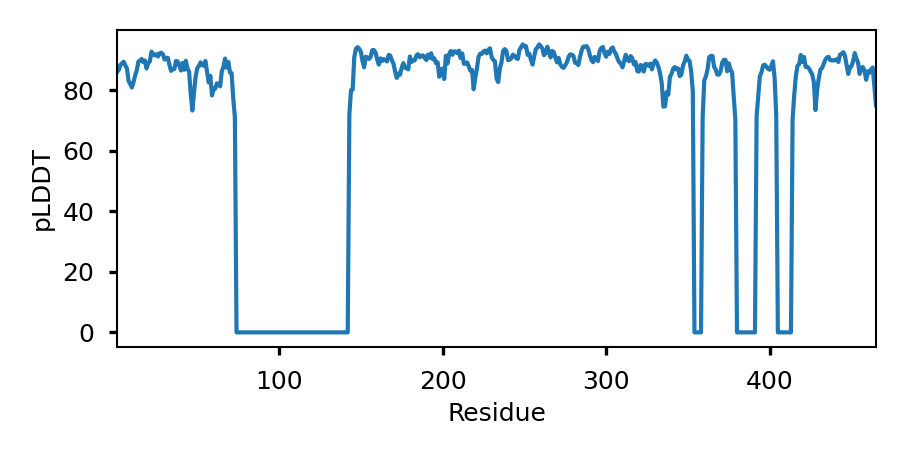

In [7]:
plot_plddt(name, pdb_folder)

## Plot Rg

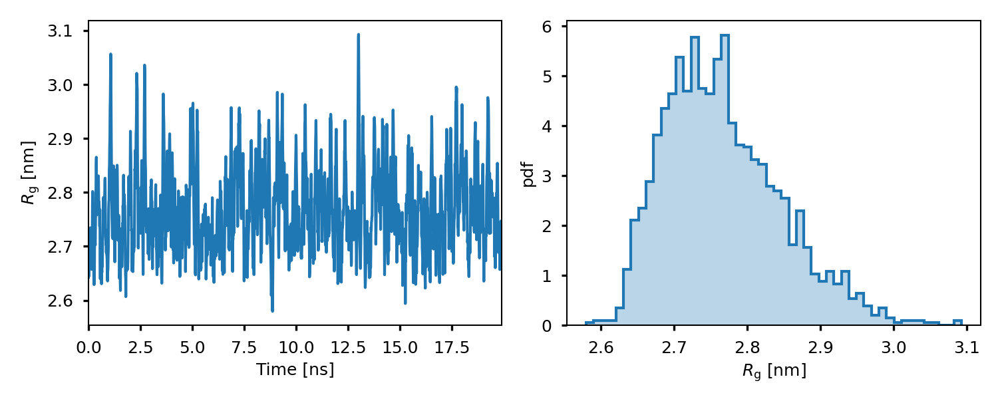

In [8]:
plot_rg(name, path)

## Plot end to end distances

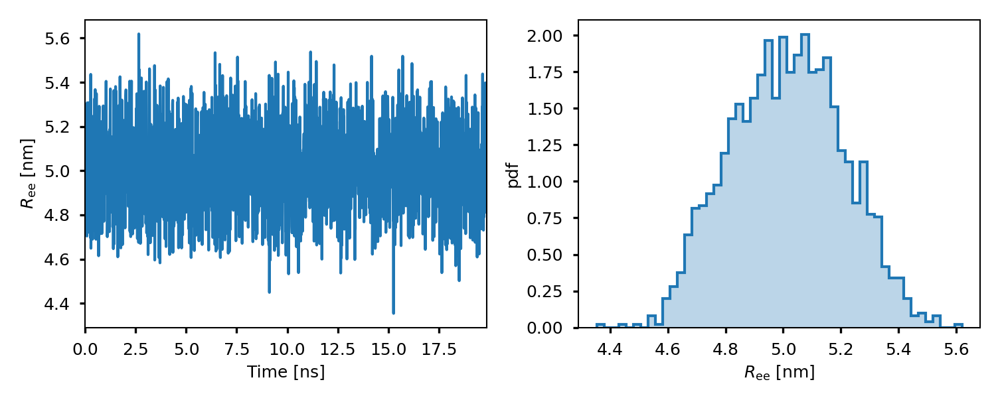

In [9]:
plot_ee(name, path)

## Plot PAE vs pairwise distance fluctuations

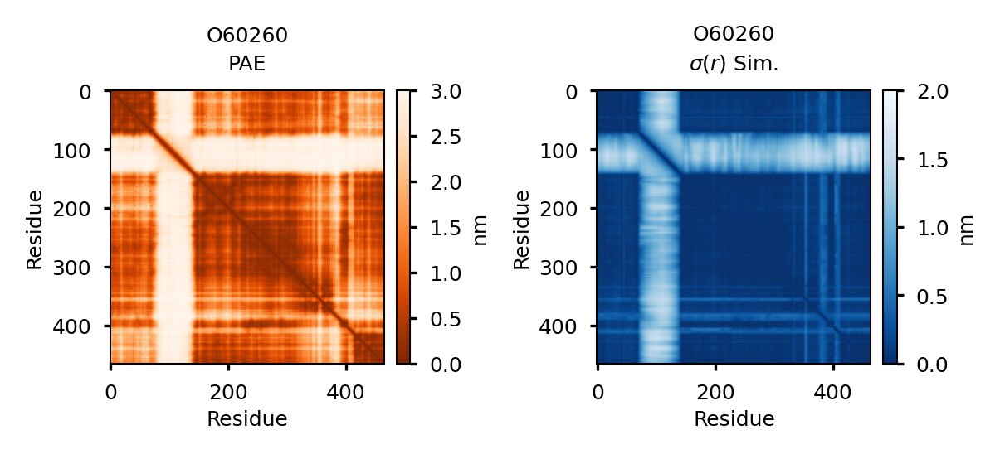

In [10]:
plot_pae_plddt(name, path, pdb_folder)

In [21]:
!pip install py3Dmol


In [113]:
from MDAnalysis.analysis import align

def align_traj(pdb, traj, start=None, stop=None, step=1, reference_frame=0):
    """RMSD-align trajectory to a reference frame and write a new DCD"""

    u = mda.Universe(pdb, traj)

    # Reference structure (usually first frame)
    ref = mda.Universe(pdb, traj)
    ref.trajectory[reference_frame]

    with mda.Writer(f"{traj[:-4]}_aligned.dcd", len(u.atoms)) as W:
        for ts in u.trajectory[start:stop:step]:
            # Align current frame to reference
            align.alignto(u, ref, select="all")
            W.write(u.atoms)

In [114]:
cal.analysis.center_traj(f'{name}/top.pdb', f'{name}/{name}.dcd')
align_traj(f'{name}/top.pdb', f'{name}/{name}_c.dcd')


In [116]:
from io import StringIO
import MDAnalysis as mda
from MDAnalysis.coordinates.PDB import PDBWriter
import py3Dmol

cmap = plt.cm.viridis

view = py3Dmol.view(width=1000, height=700)

step = 10

u = mda.Universe(f'{name}/top.pdb', f'{name}/{name}_c_aligned.dcd')

nres = len(u.atoms)
models = []
pdb_io = StringIO()

with mda.Writer('tmp.pdb', multiframe=True, format='pdb') as W:
    for ts in u.trajectory[::step]:
        W.write(u.atoms)

with open('tmp.pdb', 'r') as f:
    pdb_str = f.read()
    view.addModelsAsFrames(pdb_str)

view.setStyle({"sphere": {}})
for idx in range(nres):
    color = np.array(cmap(idx/nres)[:3])*255
    colorstr = f'rgb({color[0]}, {color[1]}, {color[2]})'
    view.setStyle({"serial": [idx+1]}, {"sphere": {"color": colorstr}})

view.zoomTo()
view.animate({"loop": "forward"})
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.